## Load Libraries

In [1]:
import pandas as pd
import numpy as np
import torch
import os
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from starfysh import (AA, utils, plot_utils, post_analysis)
from starfysh import starfysh as sf_model

import warnings
warnings.filterwarnings('ignore')

## Load Data and Marker Genes

In [2]:
# Define file paths and identifiers for data analysis
data_path = 'C:/Users/fyl/OneDrive - Teesside University/Dissertation/Starfysh/Dataset'
sample_id = 'CID44971_TNBC'
sig_name = 'bc_signatures_version_1013.csv'

In [3]:
# Load expression counts
adata, adata_normed = utils.load_adata(data_folder=data_path,
                                       sample_id=sample_id, # sample id
                                       n_genes=2000  # number of highly variable genes to keep
                                       )

[2024-12-06 10:41:18] Preprocessing1: delete the mt and rp
[2024-12-06 10:41:19] Preprocessing2: Normalize
[2024-12-06 10:41:19] Preprocessing3: Logarithm
[2024-12-06 10:41:19] Preprocessing4: Find the variable genes


In [4]:
# Load  signature gene sets
gene_sig = pd.read_csv(os.path.join(data_path, sig_name))

# Filter signaature gene set to include only relevant genes present in the dataset
gene_sig = utils.filter_gene_sig(gene_sig, adata.to_df())

# View dataframe
gene_sig.head()

,Basal,LumA,LumB,MBC,Normal epithelial,Tcm,Tem,Tfh,Treg,Activated CD8,...,Plasmablasts,MDSC,Monocytes,cDC,pDC,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Endothelial
0,EMP1,SH3BGRL,UGCG,COL11A2,KRT14,CCR7,IL7R,CXCL13,TNFRSF4,CD69,...,IGKV3-15,ITGAM,LYZ,CD80,IL3RA,APOD,COL1A1,ACTA2,CCL19,ACKR1
1,TAGLN,HSPB1,ARMT1,SDC1,KRT17,LTB,ANXA1,NMB,LTB,CCR7,...,IGHG1,CD33,IL1B,CD86,LILRA4,DCN,COL1A2,TAGLN,RGS5,FABP4
2,TTYH1,PHGR1,ISOC1,FBN2,LTF,IL7R,CXCR4,NR3C1,IL32,CD27,...,IGKV1-5,ARG1,G0S2,CCR7,CD123,PTGDS,COL3A1,MYL9,IGFBP7,PLVAP
3,RTN4,SOX9,GDF15,MMP1,KRT15,SARAF,KLRB1,DUSP4,BATF,BTLA,...,IGKV3-20,NOS2,TYROBP,CD1A,TCF4,CFD,LUM,TPM2,NDUFA4L2,RAMP2
4,TK1,CEBPD,ZFP36,FABP5,PTN,SELL,TNFAIP3,TNFRSF18,FOXP3,CD40LG,...,IGKV3-11,CD68,FCN1,CD1C,IRF7,LUM,SFRP2,NDUFA4L2,CCL2,VWF


In [5]:
# View Anndata
adata

AnnData object with n_obs × n_vars = 1162 × 18954
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'features', 'highly_variable'

... storing 'sample' as categorical


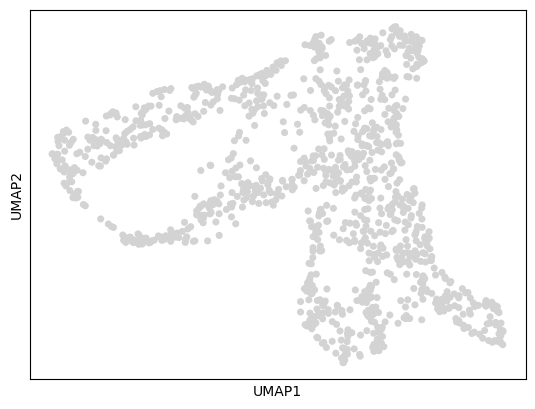

In [6]:
# Load spatial information (preprocess image)
img_metadata = utils.preprocess_img(
    data_path=data_path,
    sample_id=sample_id,
    adata_index=adata.obs.index,
    hchannel=False
)

# Extract the spatial information: image, map, and scale factor
img, map_info, scalefactor = img_metadata.get('img'), img_metadata.get('map_info'), img_metadata.get('scalefactor')

# Display UMAP (by calling the function directly)
umap_df = utils.get_umap(adata, display=True)

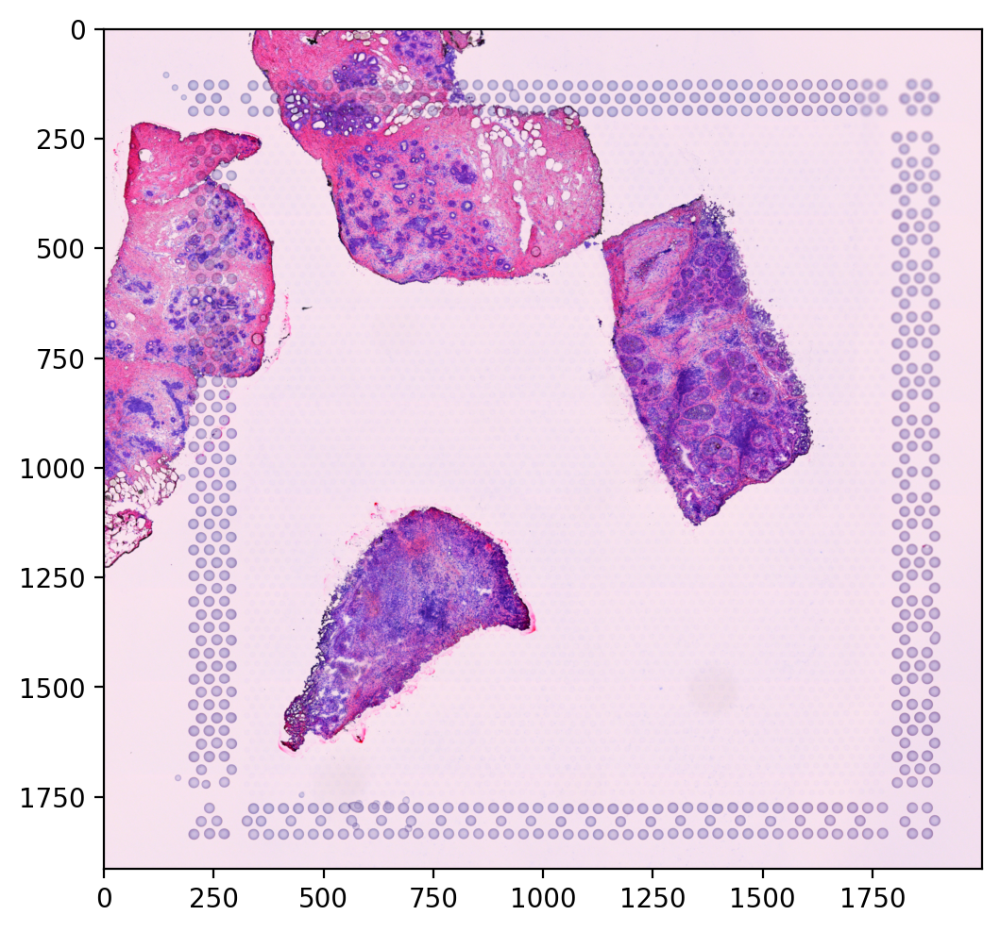

In [7]:
# Display tissue image
plt.figure(figsize=(6, 6), dpi=200)
plt.imshow(img)
plt.show()

In [8]:
# Preview map_info dataframe
map_info.head()

,array_row,array_col,imagerow,imagecol,sample
AACATTGGTCAGCCGT-1,3,17,1361,2511,CID44971_TNBC
CATCGAATGGATCTCT-1,3,19,1361,2620,CID44971_TNBC
CGGGTTGTAGCTTTGG-1,3,21,1361,2730,CID44971_TNBC
CCTAAGTGTCTAACCG-1,2,22,1266,2784,CID44971_TNBC
TCTGTGACTGACCGTT-1,3,23,1361,2839,CID44971_TNBC


In [9]:
# Parameters for training
visium_args = utils.VisiumArguments(adata,
                                    adata_normed,
                                    gene_sig,
                                    img_metadata,
                                    n_anchors=10,
                                    window_size=11,
                                    sample_id=sample_id
                                   )

adata, adata_normed = visium_args.get_adata()
anchors_df = visium_args.get_anchors()

[2024-12-06 10:41:29] Subsetting highly variable & signature genes ...
[2024-12-06 10:41:44] Smoothing library size by taking averaging with neighbor spots...
[2024-12-06 10:41:45] Retrieving & normalizing signature gene expressions...


       'HLA.DPB1'],
      dtype='object')
       'CH17-224D4.2', 'IGKV1-8', 'IGLV4-69', 'IGKV1-16', 'IGKV3D-11',
       'IGHV3-15'],
      dtype='object')
       'CD172A'],
      dtype='object')


[2024-12-06 10:41:52] Identifying anchor spots (highly expression of specific cell-type signatures)...


In [10]:
adata.shape

(1162, 2599)

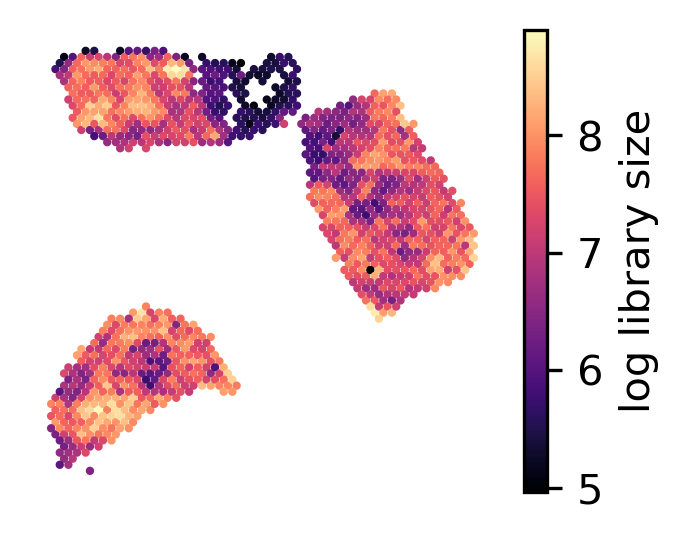

In [11]:
# Visualize spatial image
plot_utils.plot_spatial_feature(
    map_info,                 # Spatial information (map data)
    visium_args.log_lib,      # The variable (log library size) you want to plot
    label='log library size', # Label for the plot
    #vmin=None,                # Optional min value for scaling
    #vmax=None,                # Optional max value for scaling
    #figsize=(2.5, 2)          # Optional figsize
)

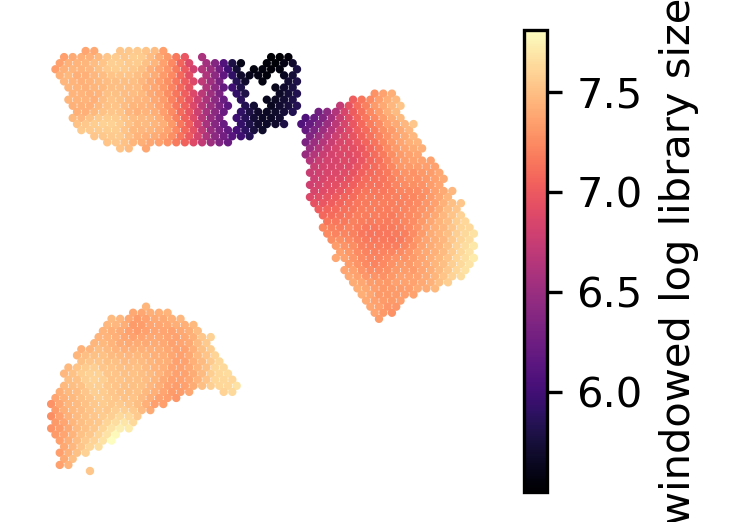

In [12]:
plot_utils.plot_spatial_feature(                                
                                map_info,
                                visium_args.win_loglib,
                                label='windowed log library size',
                                )

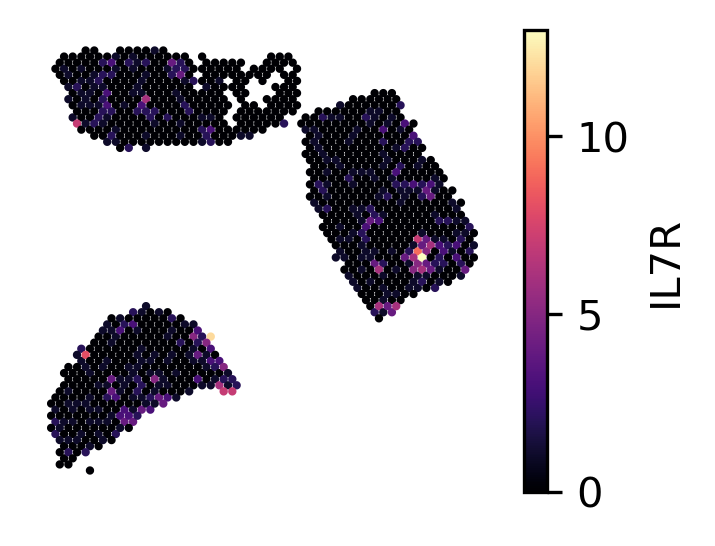

In [13]:
# Visualize spatial expression of a specific gene
plot_utils.plot_spatial_gene(adata, 
                             map_info,
                             gene_name='IL7R')

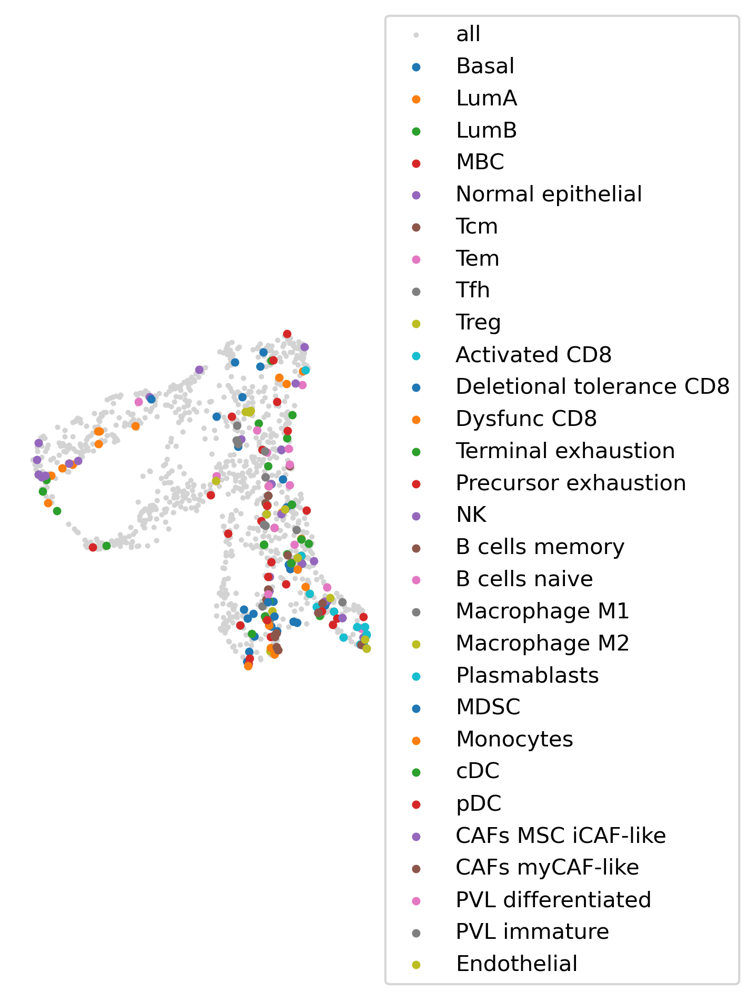

In [14]:
# Plotting Anchor Spots with UMAP and Signature mean analysis
plot_utils.plot_anchor_spots(umap_df,
                             visium_args.pure_spots,
                             visium_args.sig_mean,
                             bbox_x=2
                            )

## Run Starfysh

### Model Parameters

In [15]:
n_repeats = 3
epochs = 200
patience = 50
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

### Model Training

#### Base Starfysh deconvolution with ST expression matrix

In [16]:
# Run models
model, loss = utils.run_starfysh(visium_args,
                                 n_repeats=n_repeats,
                                 epochs=epochs,
                                 #patience=patience,
                                 device=device
                                )

[2024-12-06 10:41:54] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-12-06 10:41:54] Initializing model parameters...
[2024-12-06 10:42:21] Epoch[10/200], train_loss: 3416.6204, train_reconst: 3214.5196, train_u: 18.0049,train_z: 28.4831,train_c: 128.9237,train_l: 26.6891
[2024-12-06 10:42:44] Epoch[20/200], train_loss: 2054.8523, train_reconst: 1893.6670, train_u: 17.9364,train_z: 25.9696,train_c: 114.6043,train_l: 2.6750
[2024-12-06 10:43:08] Epoch[30/200], train_loss: 1746.8132, train_reconst: 1596.7687, train_u: 17.8712,train_z: 24.5197,train_c: 106.5029,train_l: 1.1507
[2024-12-06 10:43:37] Epoch[40/200], train_loss: 1696.5146, train_reconst: 1552.3362, train_u: 17.8177,train_z: 22.4365,train_c: 102.5238,train_l: 1.4004
[2024-12-06 10:44:02] Epoch[50/200], train_loss: 1678.8195, train_reconst: 1537.8011, train_u: 17.7743,train_z: 21.5904,train_c: 100.0443,train_l: 1.6094
[2024-12-06 10:44:30] Epoch[60/200], train_loss: 1662.8835, train_reconst: 15

[2024-12-06 11:03:59] Epoch[120/200], train_loss: 1629.8655, train_reconst: 1494.8602, train_u: 17.6252,train_z: 19.3725,train_c: 95.7981,train_l: 2.2096
[2024-12-06 11:04:21] Epoch[130/200], train_loss: 1631.9782, train_reconst: 1497.4140, train_u: 17.6163,train_z: 19.2557,train_c: 95.4559,train_l: 2.2363
[2024-12-06 11:04:44] Epoch[140/200], train_loss: 1632.6766, train_reconst: 1497.7998, train_u: 17.6090,train_z: 19.1885,train_c: 95.8113,train_l: 2.2680
[2024-12-06 11:05:06] Epoch[150/200], train_loss: 1628.2038, train_reconst: 1493.9848, train_u: 17.6030,train_z: 19.1297,train_c: 95.1978,train_l: 2.2885
[2024-12-06 11:05:28] Epoch[160/200], train_loss: 1625.7246, train_reconst: 1492.3557, train_u: 17.5982,train_z: 18.7888,train_c: 94.6756,train_l: 2.3062
[2024-12-06 11:05:51] Epoch[170/200], train_loss: 1623.0605, train_reconst: 1489.5788, train_u: 17.5942,train_z: 18.9114,train_c: 94.6290,train_l: 2.3471
[2024-12-06 11:06:13] Epoch[180/200], train_loss: 1625.5900, train_reconst: 

#### Starfysh deconvolution with histology integration

In [17]:
# Run Model using Product of Expert (PoE) model 
model_hist, loss_poe = utils.run_starfysh(visium_args,
                                     n_repeats=n_repeats,
                                     epochs=epochs,
                                     poe=True,
                                     device=device)

[2024-12-06 11:07:00] Running Starfysh with 3 restarts, choose the model with best parameters...
[2024-12-06 11:07:02] Initializing model parameters...
[2024-12-06 11:07:45] Epoch[10/200], train_loss: 16581.6014, train_reconst: 16337.1297, train_u: 18.0491,train_z: 56.5014,train_c: 141.2227,train_l: 28.6985
[2024-12-06 11:08:34] Epoch[20/200], train_loss: 14878.5519, train_reconst: 14680.1462, train_u: 18.0134,train_z: 50.8600,train_c: 125.0354,train_l: 4.4969
[2024-12-06 11:09:21] Epoch[30/200], train_loss: 14504.2072, train_reconst: 14318.9768, train_u: 17.9868,train_z: 47.8532,train_c: 118.3167,train_l: 1.0742
[2024-12-06 11:10:06] Epoch[40/200], train_loss: 14431.8500, train_reconst: 14252.2912, train_u: 17.9665,train_z: 46.0020,train_c: 114.4290,train_l: 1.1614
[2024-12-06 11:10:53] Epoch[50/200], train_loss: 14402.4135, train_reconst: 14226.5405, train_u: 17.9505,train_z: 44.2824,train_c: 112.3366,train_l: 1.3036
[2024-12-06 11:11:40] Epoch[60/200], train_loss: 14325.1315, train_

[2024-12-06 11:46:39] Epoch[110/200], train_loss: 14157.2438, train_reconst: 13991.1823, train_u: 17.9021,train_z: 40.6544,train_c: 105.8290,train_l: 1.6760
[2024-12-06 11:47:24] Epoch[120/200], train_loss: 14142.9325, train_reconst: 13978.0116, train_u: 17.8984,train_z: 39.6282,train_c: 105.6766,train_l: 1.7178
[2024-12-06 11:48:12] Epoch[130/200], train_loss: 14127.3454, train_reconst: 13962.2107, train_u: 17.8952,train_z: 40.1858,train_c: 105.3010,train_l: 1.7526
[2024-12-06 11:48:59] Epoch[140/200], train_loss: 14125.8395, train_reconst: 13961.2274, train_u: 17.8926,train_z: 40.0942,train_c: 104.8526,train_l: 1.7727
[2024-12-06 11:49:45] Epoch[150/200], train_loss: 14128.5817, train_reconst: 13964.5570, train_u: 17.8904,train_z: 39.6412,train_c: 104.7002,train_l: 1.7929
[2024-12-06 11:50:33] Epoch[160/200], train_loss: 14111.2750, train_reconst: 13947.4767, train_u: 17.8886,train_z: 39.4936,train_c: 104.5846,train_l: 1.8317
[2024-12-06 11:51:18] Epoch[170/200], train_loss: 14104.90

### Downstream analysis

#### Base Starfysh Deconvolution
##### Parse Starfysh inference output

In [18]:
# Loading data and evaluationg the spatial framework model 
adata, adata_normed = visium_args.get_adata()
inference_outputs, generative_outputs = sf_model.model_eval(model,
                                                            adata,
                                                            visium_args,
                                                            poe=False,
                                                            device=device)

##### Visualize starfysh deconvoluion results
##### Gene signature mean vs inferred proportions

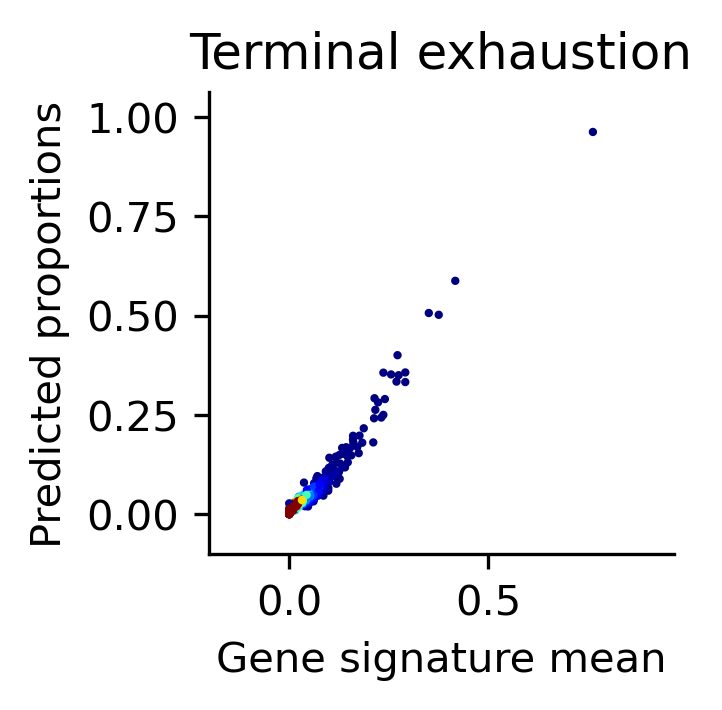

In [19]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial Visualisations
##### Inferred density on Spatial map

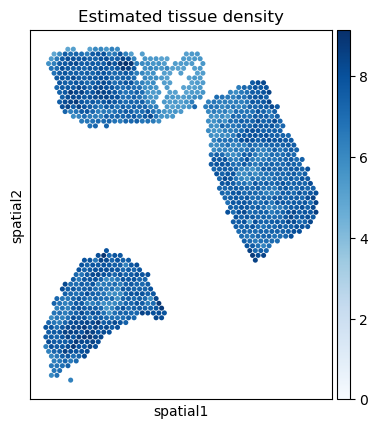

In [20]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

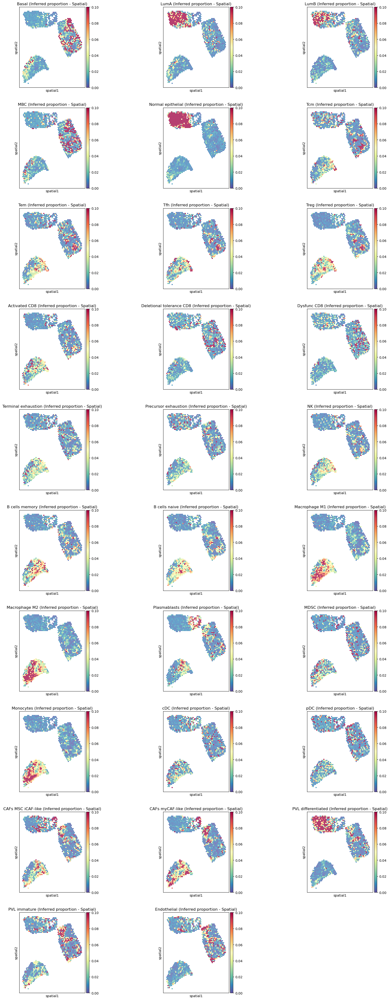

In [21]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

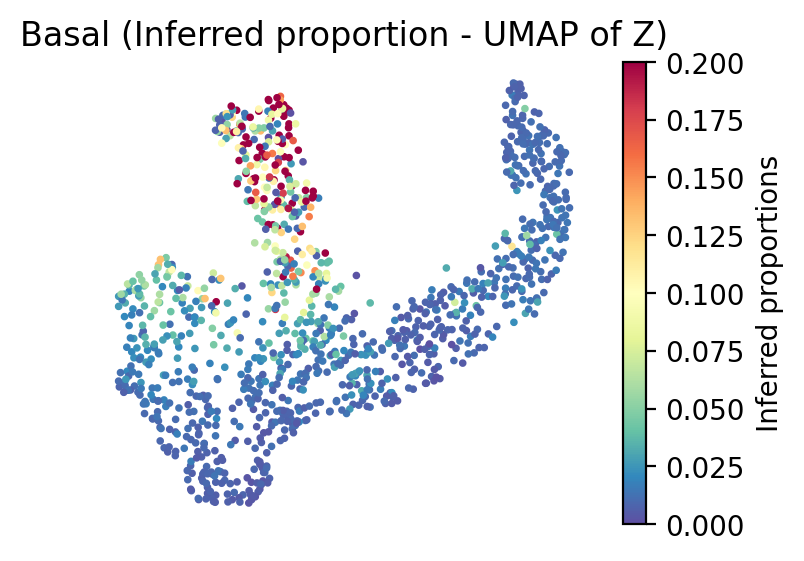

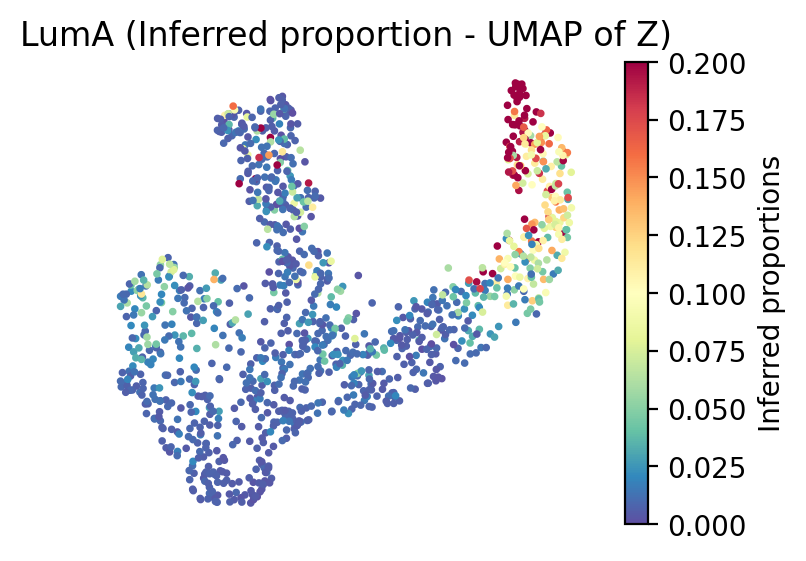

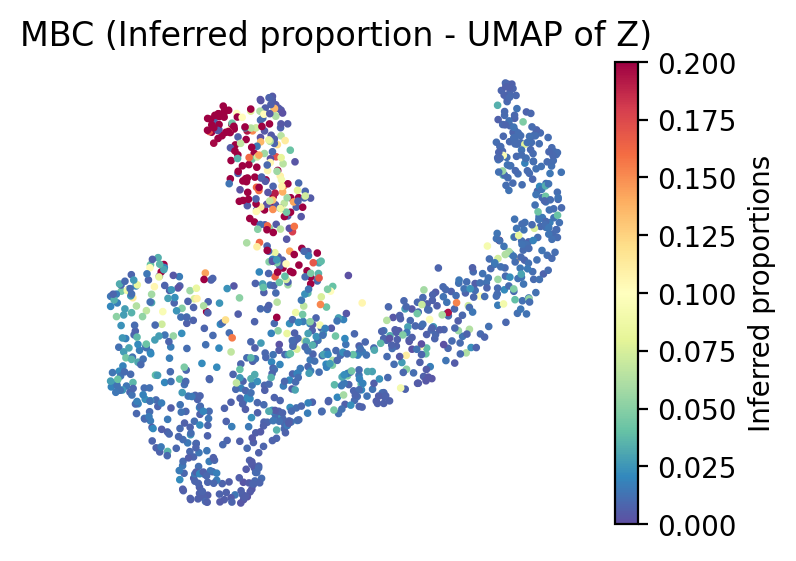

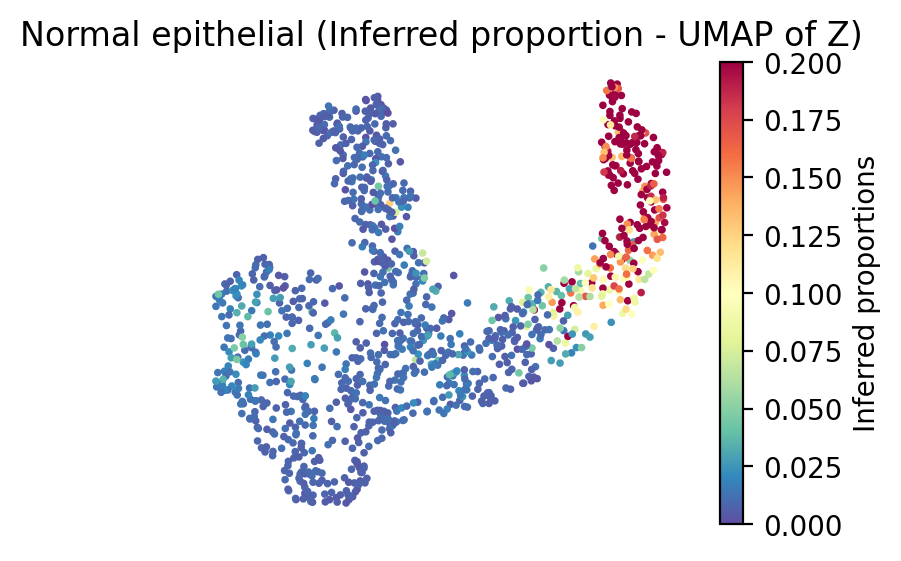

In [22]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  spot_size=3,
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [23]:
pred_exprs = sf_model.model_ct_exp(model,
                                   adata,
                                   visium_args,
                                   device=device)

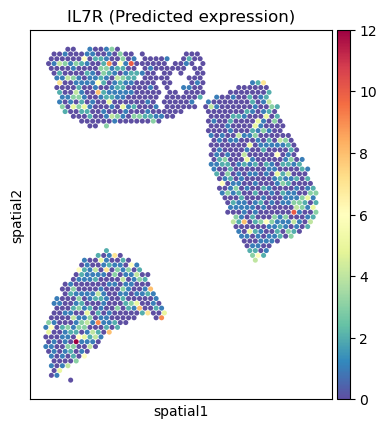

In [24]:
# Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

#### Starfysh Deconvolution with Histology Integration

##### Parse Starfysh Inference outputs

In [25]:
inference_outputs_poe, generative_outputs_poe = sf_model.model_eval(model_hist,
                                                                    adata,
                                                                    visium_args,
                                                                    poe=True,
                                                                    device=device)

#### Visualize Starfysh deconvolution results
##### Gene signature mean vs inferred proportion

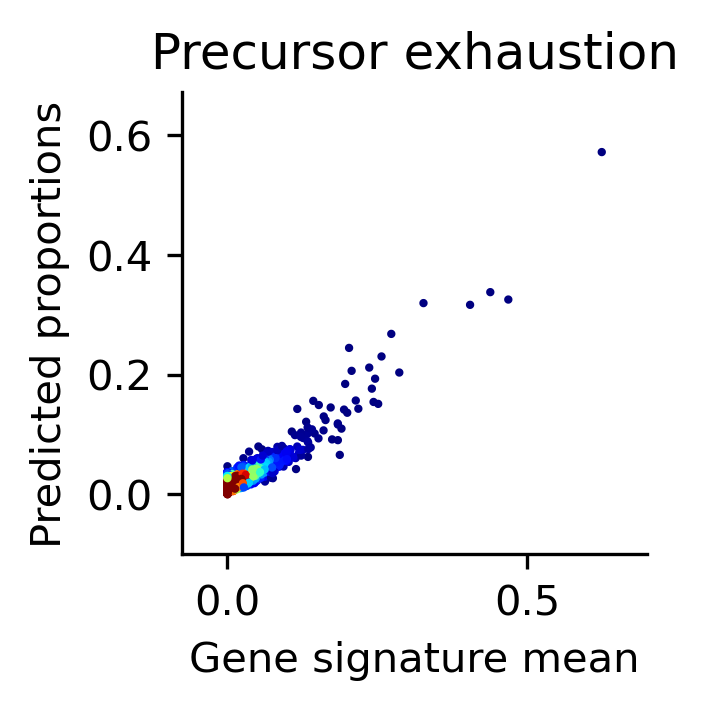

In [26]:
n_cell_types = gene_sig.shape[1]
idx = np.random.randint(0, n_cell_types)
post_analysis.gene_mean_vs_inferred_prop(inference_outputs_poe,
                                         visium_args,
                                         idx=idx
                                        )

##### Spatial visualisations

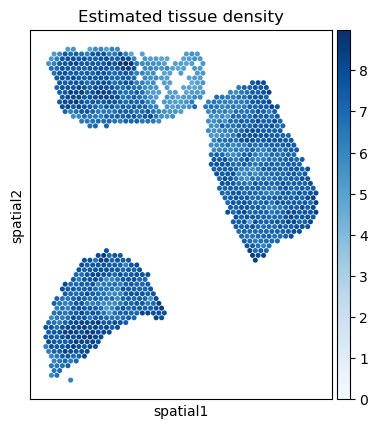

In [27]:
plot_utils.pl_spatial_inf_feature(adata, feature='ql_m', cmap='Blues')

##### Inferred cell-type proportions (spatial map)

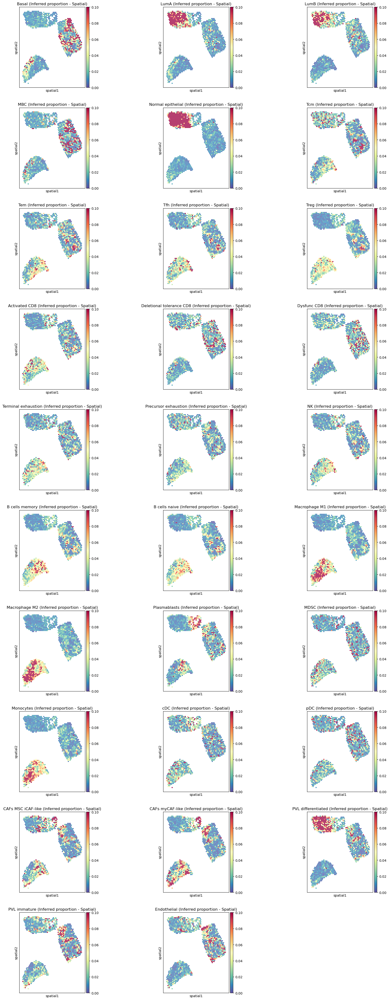

In [28]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qc_m',
                                  # To display for specific cell types:
                                  # factor = cell type or factor = [cell type1, ...]
                                  vmax=0.1)

##### Inferred cell-type proportions on Z-space (UMAP)

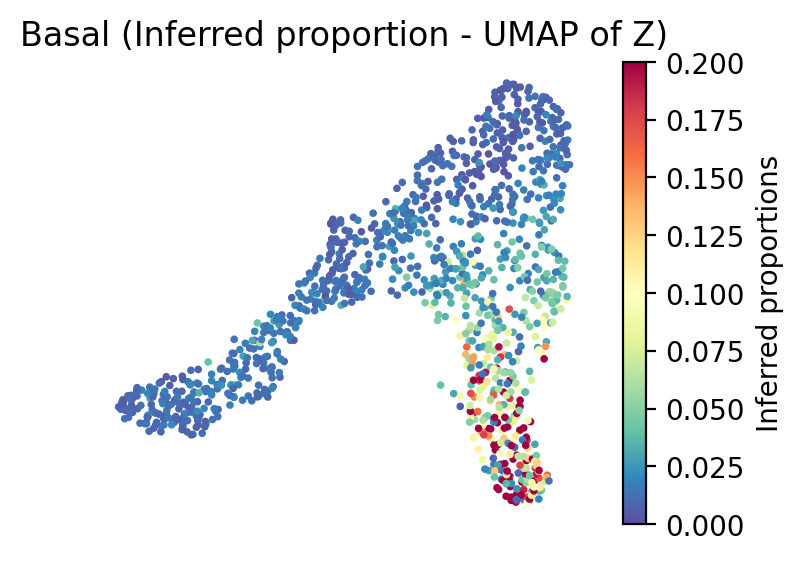

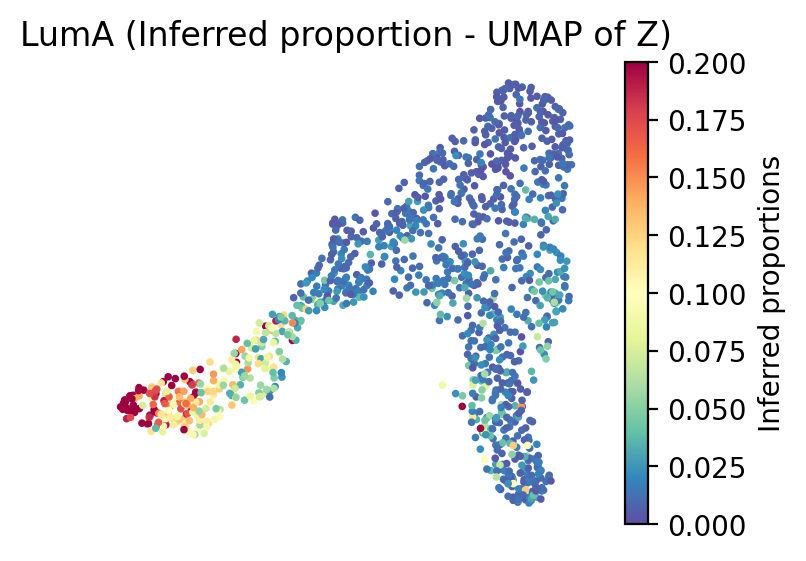

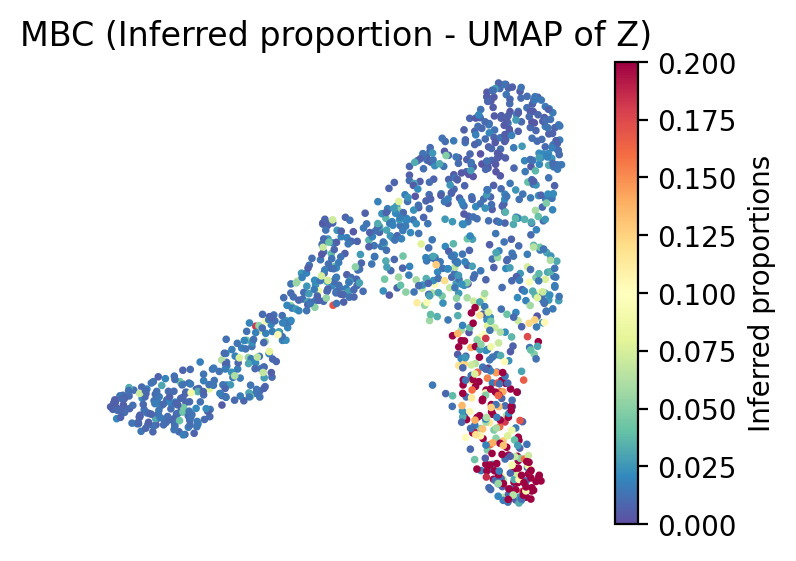

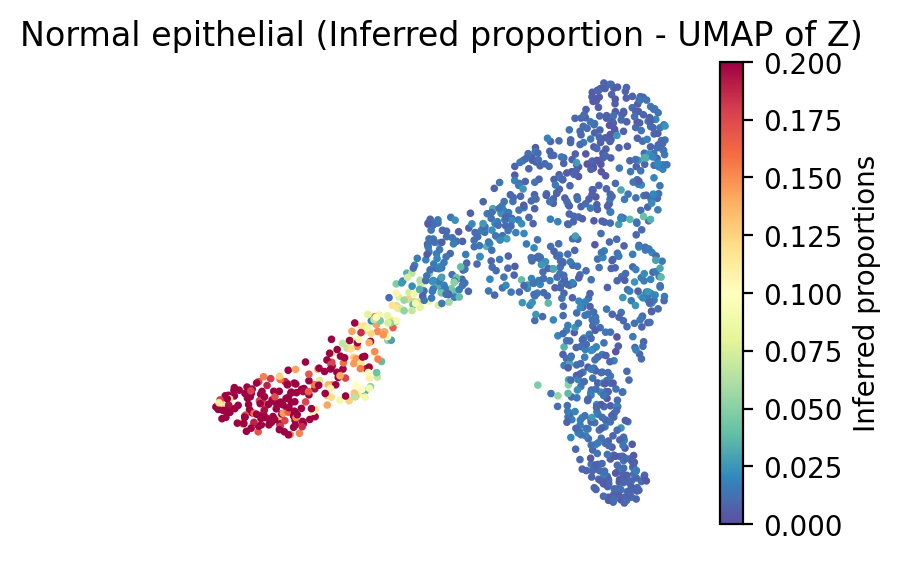

In [29]:
plot_utils.pl_spatial_inf_feature(adata,
                                  feature='qz_m',
                                  # To display for specific cell types:
                                  # factor = Cell type or factor = [Cell type1, ...]
                                  factor=['Basal', 'LumA', 'MBC', 'Normal epithelial'],
                                  vmax=0.2)

##### Infer cell-type specific expressions from each spot

In [30]:
pred_exprs = sf_model.model_ct_exp(model_hist,
                                   adata,
                                   visium_args,
                                   #poe=True,
                                   device=device)

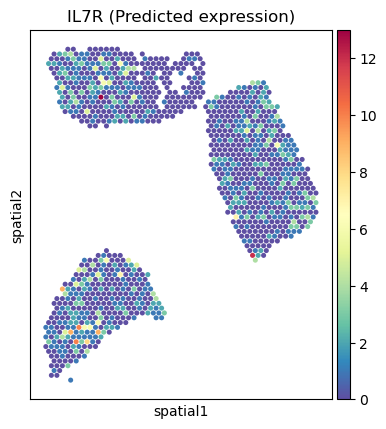

In [31]:
#Plot spot-level expression (e.g. IL7R from Effector Memory T cells (Tem))
sample_gene = 'IL7R'
sample_cell_type = 'Tem'

plot_utils.pl_spatial_inf_gene(adata,
                               factor=sample_cell_type,
                               feature=sample_gene)

#### Save model & inferred parameters

In [32]:
# Specify output directory
outdir = os.path.join(data_path, 'results')  # This creates a 'results' folder in the same directory as `data_path`
if not os.path.exists(outdir):
    os.mkdir(outdir)

# Save the base model
torch.save(model.state_dict(), os.path.join(outdir, 'starfysh_model_1_120.pt'))

# Save the PoE-trained model (model_hist)
torch.save(model_hist.state_dict(), os.path.join(outdir, 'starfysh_model_hist_1_120.pt'))

# Save `adata` object with inferred parameters
adata.write(os.path.join(outdir, 'st_1_120.h5ad'))

In [33]:
# Save results for both models
torch.save(model.state_dict(), os.path.join(outdir, 'base_model_1_120.pt'))
torch.save(model_hist.state_dict(), os.path.join(outdir, 'poe_model_1_120.pt'))

# Compare saved `adata` objects if differences are expected
adata.write(os.path.join(outdir, 'st_base_1_120.h5ad'))
adata.write(os.path.join(outdir, 'st_poe_1_120.h5ad'))